<a href="https://colab.research.google.com/github/chakravartulavinay/self_projects/blob/main/Image_Captioning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <p id = "lib" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px"> Importing Libraries</p>

In [ ]:
#!pip install fasttext

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pickle
import re
import fasttext
from tqdm.notebook import tqdm
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, Concatenate, BatchNormalization, Bidirectional, GlobalAveragePooling2D, Dot, Activation, RepeatVector, TimeDistributed, Average
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from nltk.translate.bleu_score import corpus_bleu

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"vinaychakravartula","key":"b9259df186236ef8d406ca39bc1cd423"}'}

In [ ]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d adityajn105/flickr8k

Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k
License(s): CC0-1.0
flickr8k.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import zipfile
import os

# Create a directory for the dataset
os.makedirs('flickr8k', exist_ok=True)

# Unzip the dataset
with zipfile.ZipFile('flickr8k.zip', 'r') as zip_ref:
    zip_ref.extractall('flickr8k')

# List the contents of the extracted folder
os.listdir('flickr8k')

['captions.txt', 'Images']

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
BASE_DIR = '/content/flickr8k'
WORKING_DIR = '/content/drive/MyDrive/Projects/Image_Captioning'

In [ ]:
with open(os.path.join(BASE_DIR, 'captions.txt'), 'r') as file:
    lines = file.readlines()

In [ ]:
captions_dict = {}
for line in lines:
    image_name, caption = line.strip().split(',', 1)
    if image_name not in captions_dict:
        captions_dict[image_name] = []
    captions_dict[image_name].append(caption)

## <p id = "display" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px"> Visualizing images along with their captions</p>

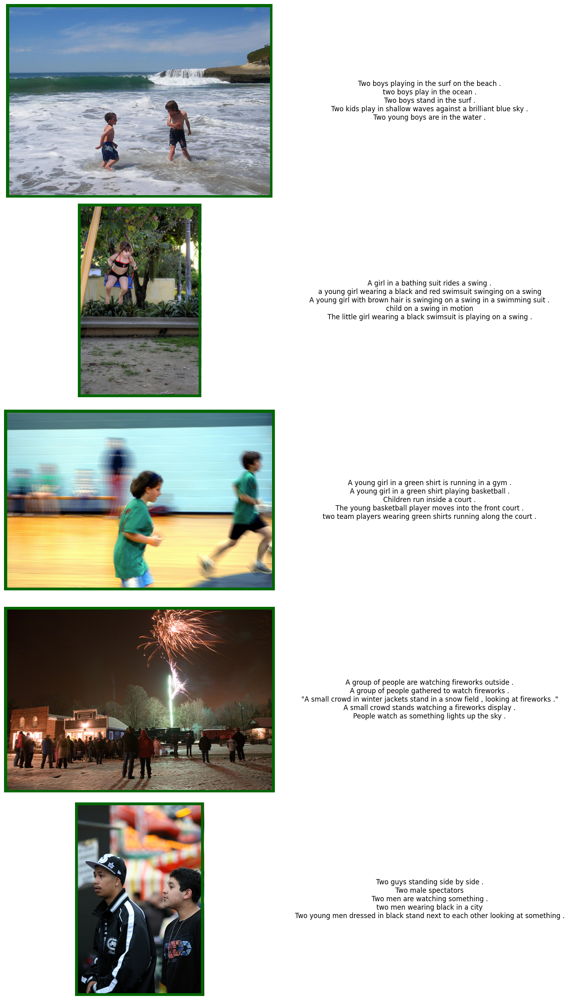

In [ ]:
selected_images = random.sample(list(captions_dict.keys()), 5)
fig, axes = plt.subplots(5, 2, figsize=(15, 25))
for idx, image_name in enumerate(selected_images):
    image_path = os.path.join(BASE_DIR, 'Images', image_name)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    axes[idx, 0].imshow(image)
    axes[idx, 0].axis('off')
    rect = patches.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=10, edgecolor='#006600', facecolor='none')
    axes[idx, 0].add_patch(rect)
    captions = captions_dict[image_name]
    captions_text = "\n".join(captions)
    axes[idx, 1].text(0.5, 0.5, captions_text, ha='center', va='center', wrap=True, fontsize=12)
    axes[idx, 1].axis('off')
plt.tight_layout()
plt.show()

## <p id="xcep" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px">Downloading EfficientNet</p>

In [ ]:
base_model = EfficientNetB0(weights='imagenet', include_top=False)
x = base_model.output
x = GlobalAveragePooling2D()(x)
model = Model(inputs=base_model.input, outputs=x)


In [ ]:
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 rescaling_10 (Rescaling)    (None, None, None, 3)        0         ['input_8[0][0]']             
                                                                                                  
 normalization_5 (Normaliza  (None, None, None, 3)        7         ['rescaling_10[0][0]']        
 tion)                                                                                            
                                                                                                  
 rescaling_11 (Rescaling)    (None, None, None, 3)        0         ['normalization_5[0][0]'

## <p id="feature" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px"> Image Feature Extraction</p>

In [ ]:
# features = {}
# directory = os.path.join(BASE_DIR, 'Images')
# for img_name in tqdm(os.listdir(directory)):
#     img_path = os.path.join(directory, img_name)
#     image = load_img(img_path, target_size=(224, 224))  # EfficientNetB0 default input size
#     image = img_to_array(image)
#     image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
#     image = preprocess_input(image)
#     # feature = model.predict(image, verbose=0)
#     image_id = img_name.split('.')[0]
#     features[image_id] = feature
# pickle.dump(features, open(os.path.join(WORKING_DIR, 'features.pkl'), 'wb'))

In [ ]:
with open(os.path.join(WORKING_DIR, 'features.pkl'), 'rb') as f:
    features = pickle.load(f)


In [ ]:
with open(os.path.join(BASE_DIR, 'captions.txt'), 'r') as f:
    next(f)
    captions_doc = f.read()

In [ ]:
mapping = {}
for line in tqdm(captions_doc.split('\n')):
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    image_id = image_id.split('.')[0]
    caption = " ".join(caption)
    if image_id not in mapping:
        mapping[image_id] = []
    mapping[image_id].append(caption)

  0%|          | 0/40456 [00:00<?, ?it/s]

## <p id = "clean" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300;margin-bottom:-30px"> Cleaning Text</p>

In [ ]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            caption = captions[i]
            caption = caption.lower()
            caption = re.sub('[^A-Za-z ]+', '', caption)
            caption = re.sub('\s+', ' ', caption)
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word) > 1]) + ' endseq'
            captions[i] = caption

In [ ]:
clean(mapping)

## <p id = "vector" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300;margin-bottom:-30px">Fasttext Vector Embeddings</p>

In [ ]:
#training fasttext for vector embeddings
with open('captions.txt', 'w') as f:
    for key in mapping:
        for caption in mapping[key]:
            f.write(caption + '\n')


fasttext_model = fasttext.train_unsupervised('captions.txt', model='skipgram', dim=512, epoch=10, lr=0.05, ws=5)


In [ ]:
embedding_dim = 512
vocab_size = len(fasttext_model.words) + 1

embedding_matrix = np.zeros((vocab_size, embedding_dim))
word_index = {word: idx for idx, word in enumerate(fasttext_model.words, 1)}

for word, idx in word_index.items():
    embedding_matrix[idx] = fasttext_model[word]

# Determine max caption length
all_captions = [caption.split() for key in mapping for caption in mapping[key]]
max_length = max(len(caption) for caption in all_captions)

In [ ]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test = image_ids[split:]

## <p id="datagen" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px"> Data Generation</p>

In [ ]:
#Data Generation Function
def data_generator(data_keys, mapping, features, word_index, max_length, vocab_size, batch_size):
    X1, X2, y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n += 1
            captions = mapping[key]
            for caption in captions:
                seq = [word_index[word] for word in caption.split() if word in word_index]
                for i in range(1, len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=max_length, padding='post')[0]
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size:
                yield (np.array(X1), np.array(X2)), np.array(y)
                X1, X2, y = list(), list(), list()
                n = 0

## <p id = "model" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px"> Model Architecture</p>

In [ ]:
#Model Architecture
inputs1 = Input(shape=(1280,))  # Change to match EfficientNetB0 output
fe1 = BatchNormalization()(inputs1)
fe2 = Dense(512, activation='relu')(fe1)
fe2_projected = RepeatVector(max_length)(fe2)

inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True, weights=[embedding_matrix], trainable=False)(inputs2)
se2 = BatchNormalization()(se1)
se3 = Bidirectional(LSTM(256, return_sequences=True))(se2)

attention = Dot(axes=[2, 2])([fe2_projected, se3])
attention = Activation('softmax')(attention)
context_vector = Dot(axes=[1, 1])([attention, se3])
context_vector = BatchNormalization()(context_vector)


context_vector = tf.keras.layers.Flatten()(context_vector)
decoder1 = Concatenate()([context_vector, fe2])
decoder2 = Dense(512, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
optimizer = Adam(learning_rate=5e-4, clipvalue=5.0)
model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])


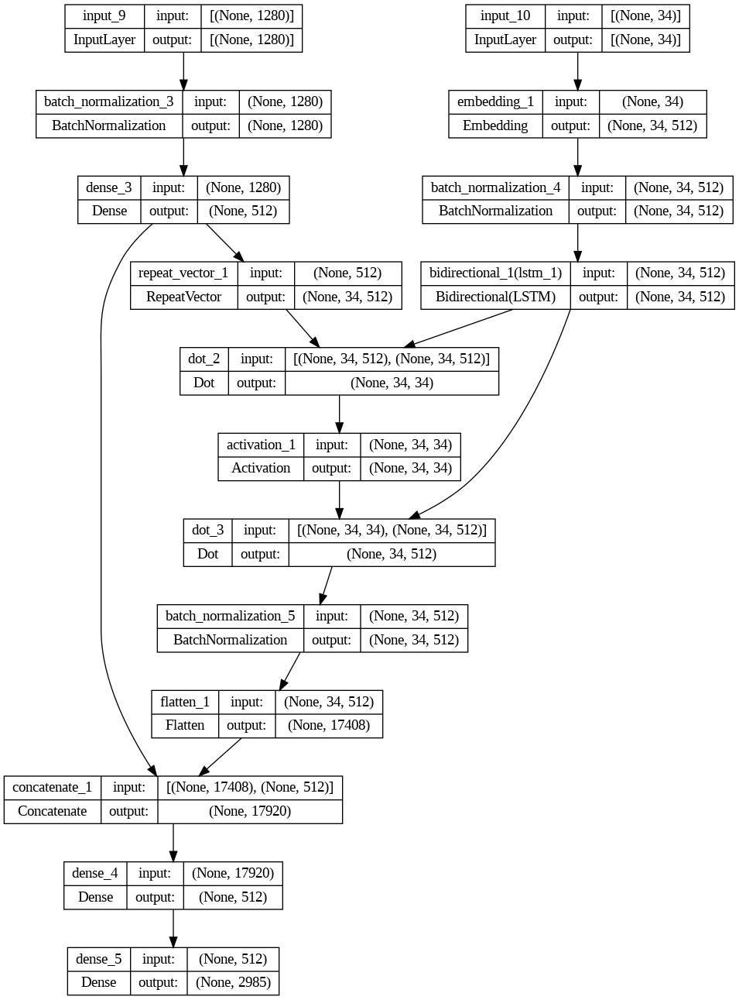

In [ ]:
from tensorflow.keras.utils import to_categorical, plot_model
plot_model(model, show_shapes=True)

## <p id = "train" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px"> Training the Model</p>

In [ ]:
epochs = 62
batch_size = 32
steps_per_epoch = len(train) // batch_size
validation_steps = len(test) // batch_size

In [ ]:
checkpoint_filepath = os.path.join(WORKING_DIR, 'model_checkpoint.keras')
model_checkpoint_callback = ModelCheckpoint(filepath=checkpoint_filepath, save_weights_only=False, monitor='val_loss', mode='min', save_best_only=True)

In [ ]:
train_generator = data_generator(train, mapping, features, word_index, max_length, vocab_size, batch_size)
valid_generator = data_generator(test, mapping, features, word_index, max_length, vocab_size, batch_size)

# Train the model
history = model.fit(train_generator,
                    epochs=epochs,
                    steps_per_epoch=steps_per_epoch,
                    validation_data=valid_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_checkpoint_callback])

Epoch 1/62
227/227 [==============================] - 51s 177ms/step - loss: 4.4829 - accuracy: 0.2321 - val_loss: 5.7171 - val_accuracy: 0.2005
Epoch 2/62
227/227 [==============================] - 38s 165ms/step - loss: 3.4159 - accuracy: 0.3168 - val_loss: 3.7909 - val_accuracy: 0.2918
Epoch 3/62
227/227 [==============================] - 36s 160ms/step - loss: 3.0135 - accuracy: 0.3523 - val_loss: 3.3186 - val_accuracy: 0.3247
Epoch 4/62
227/227 [==============================] - 36s 158ms/step - loss: 2.7276 - accuracy: 0.3819 - val_loss: 3.3259 - val_accuracy: 0.3310
Epoch 5/62
227/227 [==============================] - 35s 156ms/step - loss: 2.4837 - accuracy: 0.4129 - val_loss: 3.3787 - val_accuracy: 0.3303
Epoch 6/62
227/227 [==============================] - 36s 158ms/step - loss: 2.2738 - accuracy: 0.4466 - val_loss: 3.4691 - val_accuracy: 0.3297
Epoch 7/62
227/227 [==============================] - 36s 158ms/step - loss: 2.0878 - accuracy: 0.4786 - val_loss: 3.5927 - val_ac

In [ ]:
def idx_to_word(integer, word_index):
    for word, index in word_index.items():
        if index == integer:
            return word
    return None

In [ ]:
def predict_caption(model, image, word_index, max_length):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [word_index[word] for word in in_text.split() if word in word_index]
        sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
        yhat = model.predict([image, sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = idx_to_word(yhat, word_index)
        if word is None:
            break
        in_text += " " + word
        if word == 'endseq':
            break
    return in_text

## <p id = "bleu" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px"> Evaluation on Test-set</p>

In [ ]:
actual, predicted = list(), list()
for key in tqdm(test):
    captions = mapping[key]
    y_pred = predict_caption(model, features[key], word_index, max_length)
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    actual.append(actual_captions)
    predicted.append(y_pred)

print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))


  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.528430
BLEU-2: 0.291175


In [ ]:
model.save(os.path.join(WORKING_DIR, 'model.keras'))

## <p id = "results" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px"> Results</p>

In [ ]:
def generate_caption(image_name):
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "Images", image_name)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    y_pred = predict_caption(model, features[image_id], word_index, max_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)

--------------------Predicted--------------------
startseq man in blue jacket opens his big black boat endseq


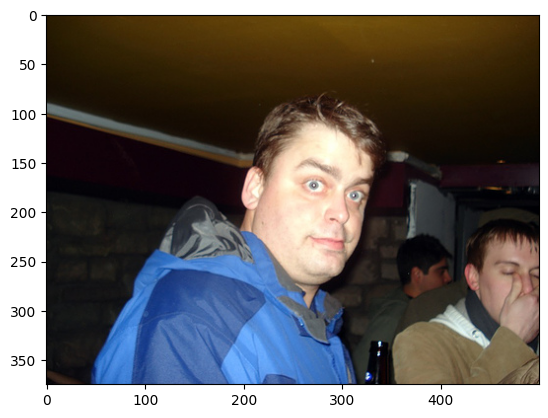

In [ ]:
generate_caption('397286183_745abbf40d.jpg')

--------------------Predicted--------------------
startseq young blonde haired toddler and is holding onto red and white chair endseq


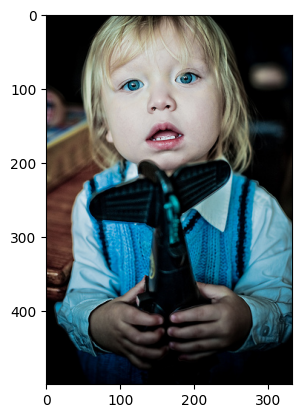

In [ ]:
generate_caption('3426144752_28d63615ca.jpg')

--------------------Predicted--------------------
startseq two young women are posing together while smiling endseq


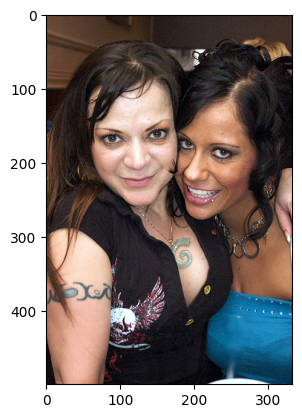

In [ ]:
generate_caption('3396153660_f729d9f9b9.jpg')

--------------------Predicted--------------------
startseq an asian boy is attempting off of stone wall endseq


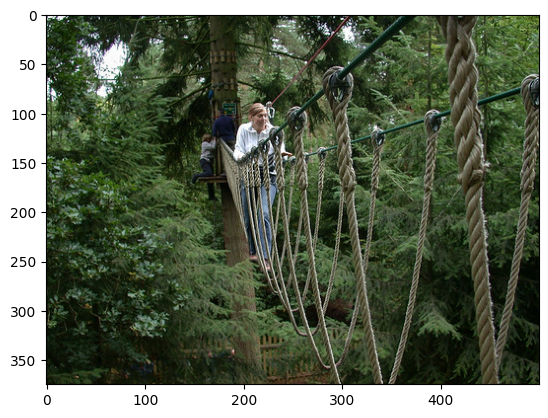

In [ ]:
generate_caption('136644885_f7d2bbf546.jpg')

--------------------Predicted--------------------
startseq man trying to throw ball from an open white and white to the has his hand endseq


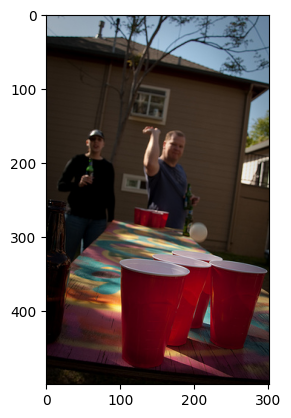

In [ ]:
generate_caption('3399906919_bc8562b257.jpg')

--------------------Predicted--------------------
startseq the boys are wearing the same uniforms endseq


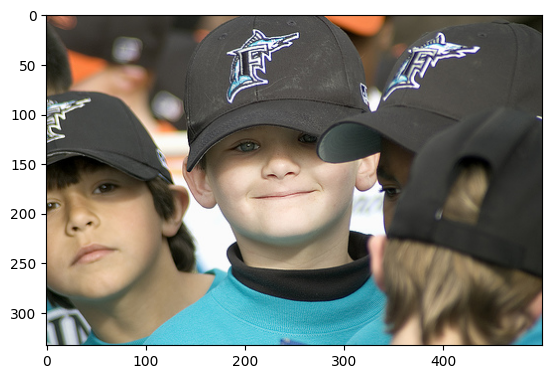

In [ ]:
generate_caption('118309463_a532b75be9.jpg')

--------------------Predicted--------------------
startseq boy laying on sitting swing face down wearing hat backwards endseq


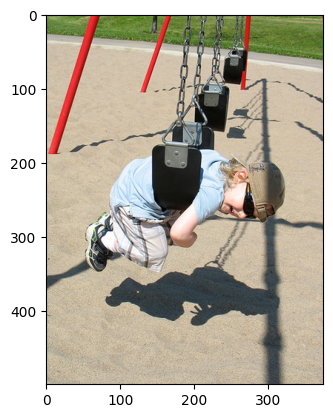

In [ ]:
generate_caption('3643074723_94d42b7a0c.jpg')

--------------------Predicted--------------------
startseq group of boys are standing around another wearing black and white are running on the grass endseq


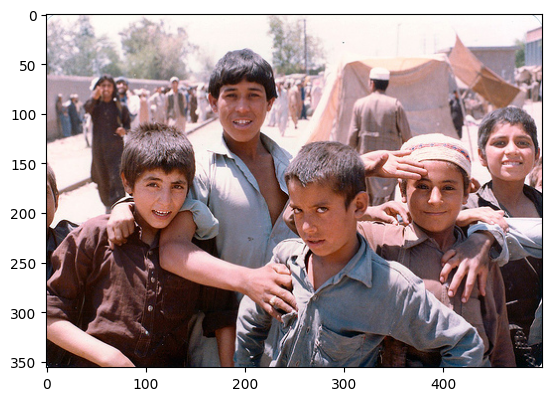

In [ ]:
generate_caption('2211593099_4a4f1c85d2.jpg')

--------------------Predicted--------------------
startseq the young girls are listening with books in front of them endseq


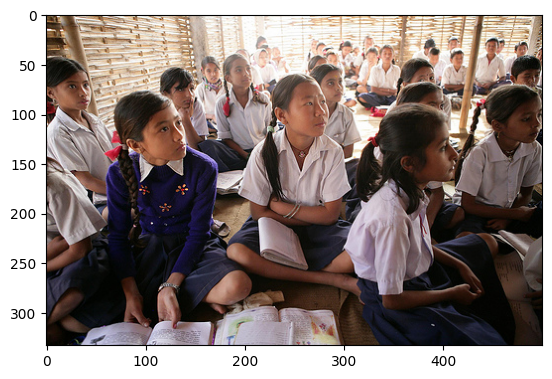

In [ ]:
generate_caption('3327487011_1372c425fb.jpg')

--------------------Predicted--------------------
startseq several cyclists wearing different riding bikes on the track endseq


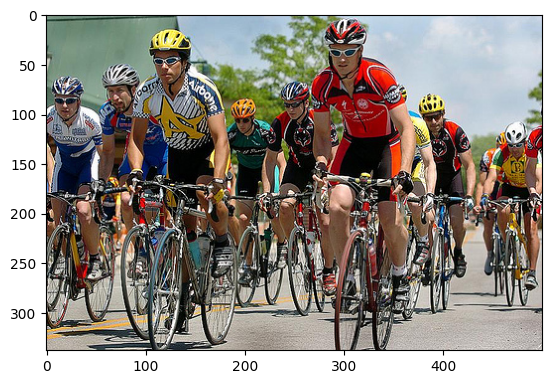

In [ ]:
generate_caption('2986671935_0c60bbb3fa.jpg')

--------------------Predicted--------------------
startseq boy wearing clothes looks down endseq


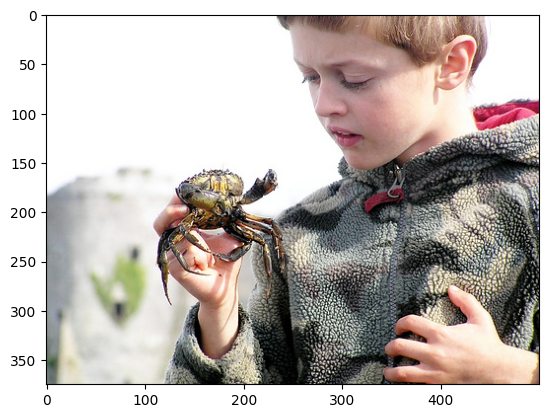

In [ ]:
generate_caption('2355578735_286af5b202.jpg')

--------------------Predicted--------------------
startseq woman stretching on beach at sunset endseq


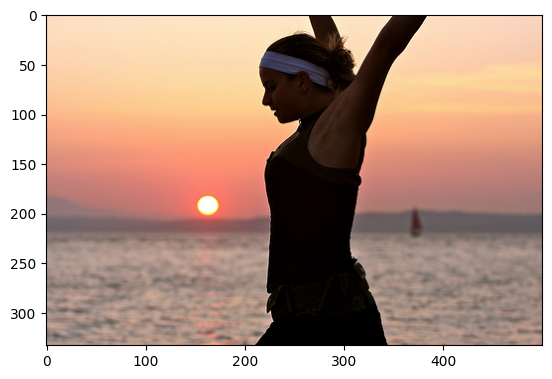

In [ ]:
generate_caption('3630991662_990f397f7c.jpg')

--------------------Predicted--------------------
startseq two scuba diving are in the air endseq


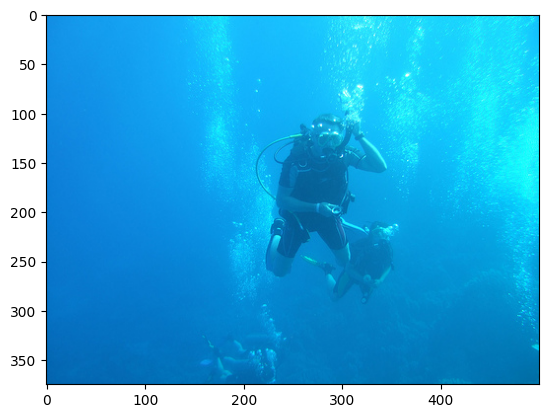

In [ ]:
generate_caption('2711075591_f3ee53cfaa.jpg')

In [ ]:
def generate_caption(image_name):
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "Images", image_name)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    y_pred = predict_caption(model, features[image_id], word_index, max_length)
#     print('--------------------Predicted--------------------')
#     print(y_pred)
#     plt.imshow(image)
    return y_pred.replace("startseq ", "").replace(" endseq", "")
#     return y_pred

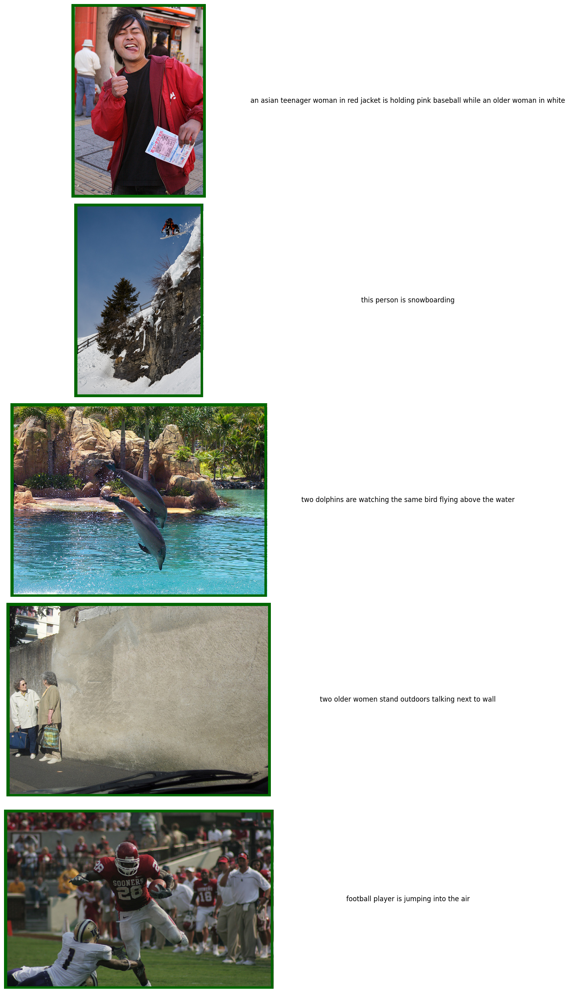

In [ ]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

def display_random_images_with_captions(directory, num_images=5):
    image_list = [f for f in os.listdir(directory) if f.endswith('.jpg')]

    random_images = random.sample(image_list, num_images)

    fig, axes = plt.subplots(num_images, 2, figsize=(15, 5 * num_images))

    for idx, image_name in enumerate(random_images):

        image_path = os.path.join(directory, image_name)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        axes[idx, 0].imshow(image)
        axes[idx, 0].axis('off')


        rect = patches.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=10, edgecolor='#006600', facecolor='none')
        axes[idx, 0].add_patch(rect)


        caption = generate_caption(image_name)
        axes[idx, 1].text(0.5, 0.5, caption, ha='center', va='center', wrap=True, fontsize=12)
        axes[idx, 1].axis('off')



    plt.tight_layout()
    plt.show()



image_directory = '/content/flickr8k/Images'
display_random_images_with_captions(image_directory)


In [ ]:
caption_model = tf.keras.models.load_model('/content/drive/MyDrive/Projects/Image_Captioning/model.keras')

In [ ]:
def load_image_from_url(url, target_size=(299, 299)):
    response = requests.get(url)
    image_array = np.asarray(bytearray(response.content), dtype=np.uint8)
    img = cv2.imdecode(image_array, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img = cv2.resize(img, target_size)
    return img

In [ ]:
def display_image_with_caption(image, caption):
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    ax.axis('off')


    rect = patches.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=5, edgecolor='r', facecolor='none')
    ax.add_patch(rect)


    plt.figtext(0.5, 0.01, caption, wrap=True, horizontalalignment='center', fontsize=12)
    plt.show()

## <p id = "int" style="font-family:Cambaria; font-weight:bold;  color:#006600; font-size:140%; text-align:left;padding: 0px;  border-bottom: 3px solid #003300; margin-bottom:-25px">Testing on Random Images from Internet</p>

In [ ]:
def generate_caption_for_image_url(image_url, caption_model, word_index, max_length):
    # Load and preprocess the image
    image = load_image_from_url(image_url)
    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)

    # Extract features using EfficientNetB0
    base_model = EfficientNetB0(weights='imagenet', include_top=False)
    x = GlobalAveragePooling2D()(base_model.output)
    feature_ext_model = Model(inputs=base_model.inputs, outputs=x)
    features = feature_ext_model.predict(image_array, verbose=0)

    # Generate caption using the caption model
    caption = predict_caption(caption_model, features, word_index, max_length)
    caption = caption.replace('startseq', '').replace('endseq', '').strip()

    display_image_with_caption(image, caption)

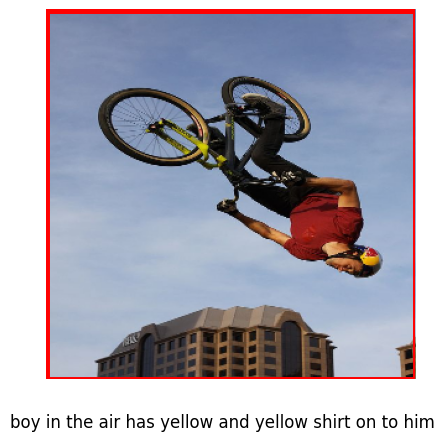

In [ ]:
import requests
image_url = 'https://i.pinimg.com/736x/7e/71/d3/7e71d3778c649016dff30852487b3397.jpg'
generate_caption_for_image_url(image_url, caption_model, word_index, max_length)

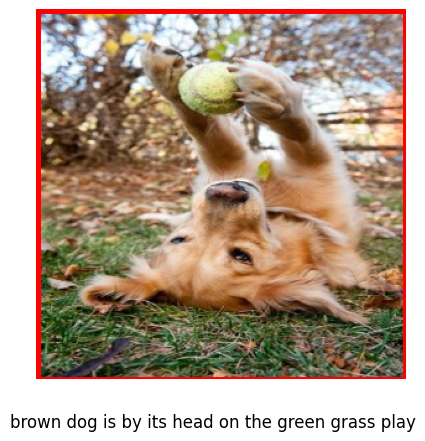

In [ ]:
image_url = 'https://i.pinimg.com/474x/96/25/f7/9625f718111c84944dab816667137e6d.jpg'
generate_caption_for_image_url(image_url, caption_model, word_index, max_length)

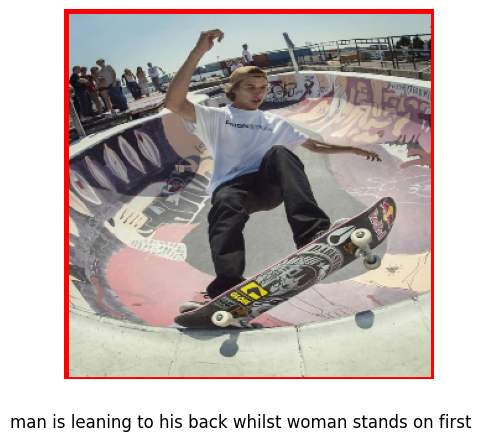

In [ ]:
image_url = 'https://i.pinimg.com/736x/3e/fb/52/3efb52f24f6695606e456e6662e8816a.jpg'
generate_caption_for_image_url(image_url, caption_model, word_index, max_length)